# Proyecto Final Ejercicio # 2

Título: Diagnóstico de Diabetes


Objetivo:
El objetivo de este ejercicio es predecir la presencia de diabetes en pacientes basándose
en sus características médicas utilizando técnicas de clasificación en Python con scikitlearn.

Dataset:
Utilizaremos el dataset "Pima Indians Diabetes Dataset" disponible en UCI Machine Learning Repository. Este dataset contiene información sobre pacientes y si han sido diagnosticados con diabetes o no.

Descripción del Dataset:

El dataset contiene las siguientes columnas:
- `Pregnancies`: Número de embarazos.
- `Glucose`: Concentración de glucosa.
- `BloodPressure`: Presión arterial diastólica.
- `SkinThickness`: Grosor del pliegue cutáneo.
- `Insulin`: Insulina en suero.
- `BMI`: Índice de masa corporal.
- `DiabetesPedigreeFunction`: Función de pedigrí de diabetes.
- `Age`: Edad.

- Visualizar la distribución de las características utilizando histogramas y diagramas de caja (boxplots).
 - Analizar las correlaciones entre las variables utilizando un mapa de calor (heatmap).

- `Outcome`: Variable objetivo (1 si tiene diabetes, 0 si no tiene).

Instrucciones:
1. Análisis Exploratorio de Datos (EDA):
- Cargar el dataset y mostrar las primeras filas.
- Describir estadísticamente las características del dataset.
- Visualizar la distribución de las características utilizando histogramas y diagramas de caja (boxplots).
- Analizar las correlaciones entre las variables utilizando un mapa de calor (heatmap).
2. Preprocesamiento de Datos:
- Manejar los valores faltantes.
- Detectar y manejar los outliers.
- Estandarizar y normalizar las características según sea necesario.
3. Modelado:
- Dividir el dataset en conjunto de entrenamiento y conjunto de prueba.
- Probar al menos tres modelos de clasificación distintos (por ejemplo, Logistic Regression, Random Forest, y Support Vector Machine).
- Utilizar técnicas de cross-validación para evaluar los modelos.
- Optimizar los hiperparámetros de los modelos utilizando GridSearchCV o RandomizedSearchCV.
4. Evaluación:
- Evaluar el desempeño de los modelos utilizando métricas apropiadas (accuracy, precision, recall, F1-score, AUC-ROC).
- Comparar los resultados y seleccionar el mejor modelo basado en las métricas de desempeño.
5. Conclusión:
- Presentar un resumen de los hallazgos y las conclusiones obtenidas del análisis.
- Discutir las implicaciones de los resultados y posibles mejoras futuras.




In [ ]:
pip install matplotlib

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Get the data from the mounted drive
# data_path = '/content/drive/MyDrive/ProyectoFinalIA/dataset/diabetes.csv'
data_path = '/content/drive/MyDrive/Colab Notebooks/data/diabetes.csv'

In [ ]:
df = pd.read_csv(data_path)

# Importando los datos

In [ ]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


# Tipos de datos

In [ ]:
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

# Tamaño del Dataset

In [ ]:
print(df.shape)
print(type(df.shape))

(768, 9)
<class 'tuple'>


# Valores nulos

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [ ]:
# Another way: using the isna() method
for column in df.columns:
    num_nulls = df[column].isna().sum()
    print(f'Column "{column}" has {num_nulls} nulls')

Column "Pregnancies" has 0 nulls
Column "Glucose" has 0 nulls
Column "BloodPressure" has 0 nulls
Column "SkinThickness" has 0 nulls
Column "Insulin" has 0 nulls
Column "BMI" has 0 nulls
Column "DiabetesPedigreeFunction" has 0 nulls
Column "Age" has 0 nulls
Column "Outcome" has 0 nulls


# Valores duplicados

In [ ]:
df[df.duplicated(keep=False)]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


# Distribución de variables

<ipython-input-388-d8c90070cb8f>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

<ipython-input-388-d8c90070cb8f>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

<ipython-input-388-d8c90070cb8f>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use eith

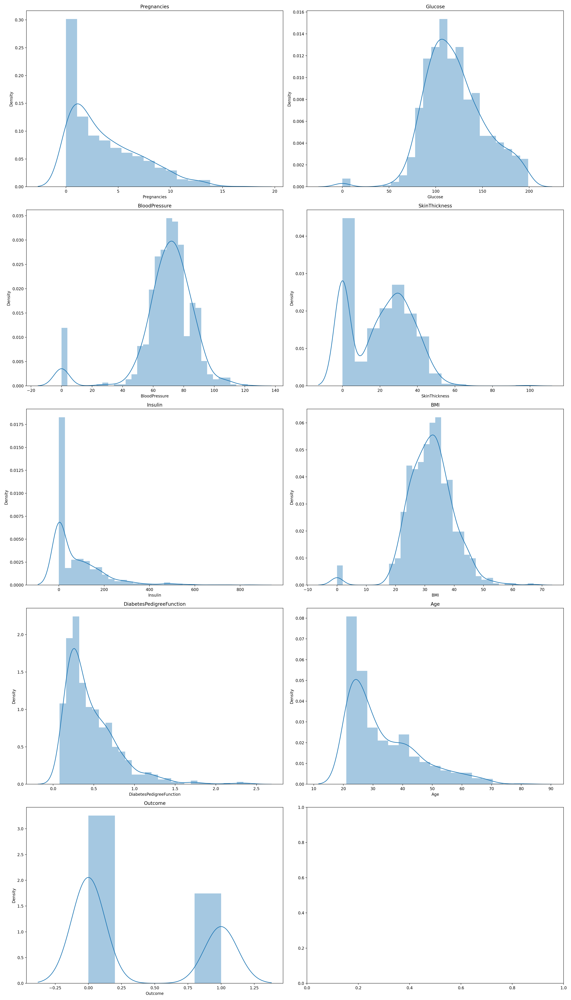

In [ ]:
cols = df.columns

fig, ax = plt.subplots(nrows=int(np.ceil(len(cols)/2)), ncols = 2, figsize = (20, 35))

i,j = 0,0
for c in cols:
    sns.distplot(df[c], hist = True, kde = True, ax = ax[i,j])

    ax[i,j].set_title(c)

    j+=1
    if j==2:
        i+=1
        j=0

plt.tight_layout()

# Vamos a medir ahora el *skewness* y la *kurtosis* de cada variable.

In [ ]:
for c in cols:
    print(f"------{c}------")
    print("Skewness: %f" % df[c].skew())
    print("Kurtosis: %f" % df[c].kurt())

------Pregnancies------
Skewness: 0.901674
Kurtosis: 0.159220
------Glucose------
Skewness: 0.173754
Kurtosis: 0.640780
------BloodPressure------
Skewness: -1.843608
Kurtosis: 5.180157
------SkinThickness------
Skewness: 0.109372
Kurtosis: -0.520072
------Insulin------
Skewness: 2.272251
Kurtosis: 7.214260
------BMI------
Skewness: -0.428982
Kurtosis: 3.290443
------DiabetesPedigreeFunction------
Skewness: 1.919911
Kurtosis: 5.594954
------Age------
Skewness: 1.129597
Kurtosis: 0.643159
------Outcome------
Skewness: 0.635017
Kurtosis: -1.600930


<ipython-input-390-9ea3e3f86f04>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

<ipython-input-390-9ea3e3f86f04>:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

<ipython-input-390-9ea3e3f86f04>:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use eith

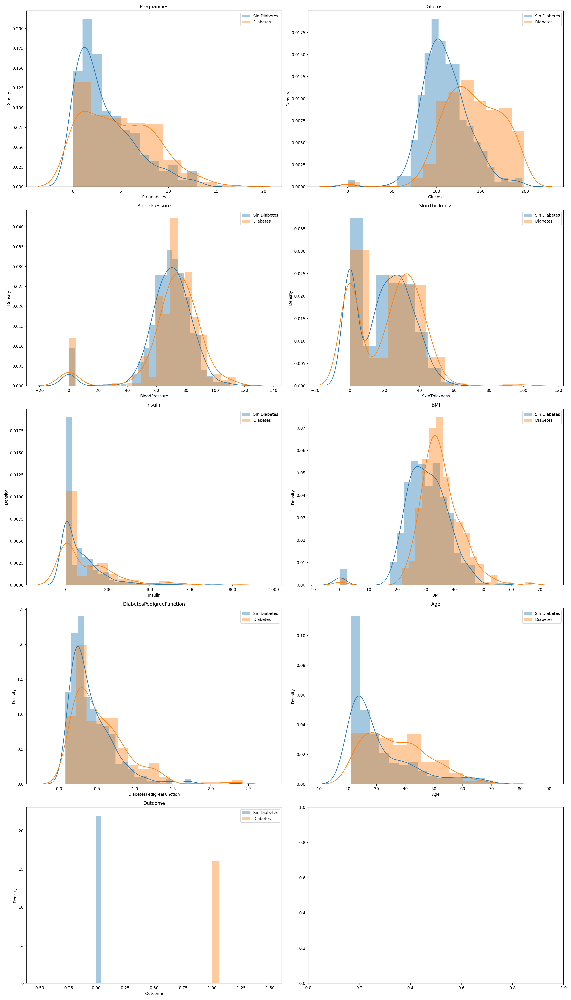

In [ ]:
cols = df.columns

fig, ax = plt.subplots(nrows=int(np.ceil(len(cols)/2)), ncols = 2, figsize = (20, 35))

i,j = 0,0
for c in cols:
    sns.distplot(df.query('Outcome == 0')[c], hist = True, kde = True, ax = ax[i,j], label = 'Sin Diabetes')
    sns.distplot(df.query('Outcome == 1')[c], hist = True, kde = True, ax = ax[i,j], label = 'Diabetes')

    ax[i,j].set_title(c)
    ax[i,j].legend()

    j+=1
    if j==2:
        i+=1
        j=0

plt.tight_layout()

Como podemos observar, a través de la discriminación de la variable objetivo "Outcome", en sus valores de 0 para "Sin Diabetes" y 1 para "Con Diabetes", se puede diagramar el comportamiento de las variables de los datos y su distribución para cada discriminación.

Por lo tanto, en este sentido se puede apreciar lo siguiente:


1.   La variable "**Glucose**" es determinante para conocer si una persona puede ser clasificada con Diabetes, ya que el área bajo la curva es mayor en densidad y está ajustada más hacia la derecha.
2.   La variable "**BMI**" presenta un comportamiento similar.
3. Al igual que la "**DiabetesPedigreeFunction**"
4. Y la variable "**Age**"



# Valores anómalos (outliers)

<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
<ipython-input-391-75219cef856a>:8: UserWarning: FixedFormatter should only be used together with FixedLocator


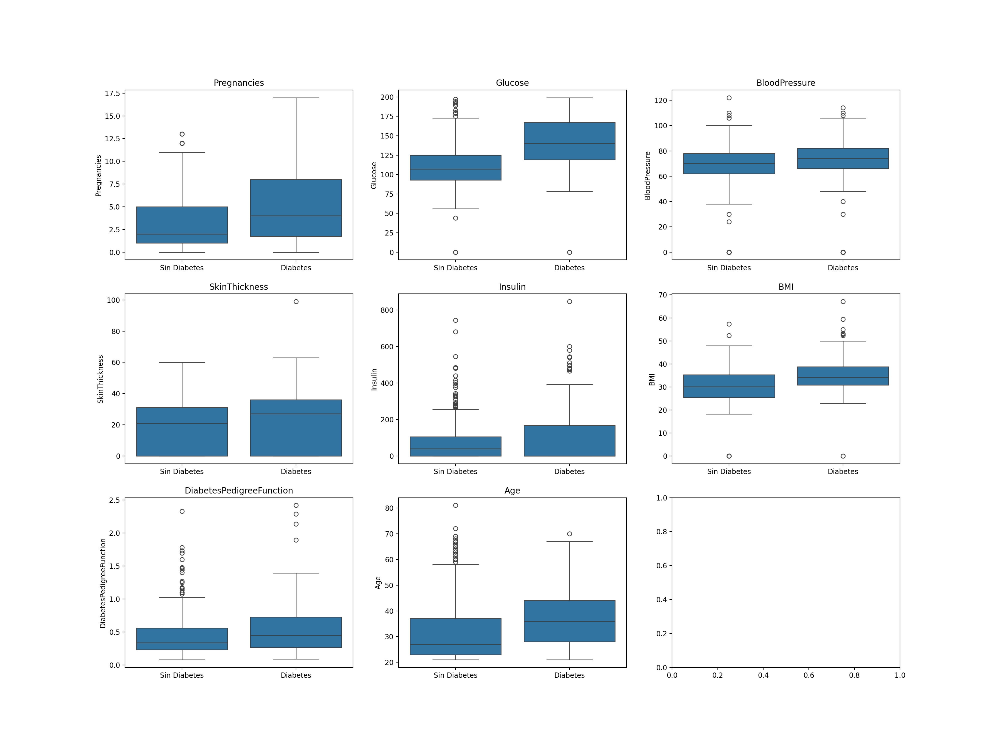

In [ ]:
fig, ax = plt.subplots(nrows=int(np.ceil(len(cols)/3)), ncols = 3, figsize = (20, 15))

i,j = 0,0
for c in cols.delete(-1):
    sns.boxplot(x = 'Outcome', y = c, data = df, ax = ax[i,j], )
    ax[i,j].set_title(c)
    ax[i,j].set_xlabel('')
    ax[i,j].set_xticklabels(np.array(['Sin Diabetes', 'Diabetes']))

    j+=1
    if j==3:
        j=0
        i+=1

En este plot, en cambio, se logran identificar los outliers para cada variable, considerando también esta discriminación entre el target "**Outcome**", así como también la media de los datos por cada variable considerando dicha discriminación.

En este caso entonces podemos evidenciar claramente que la **Glucose**, el **BMI**, la **DiabetesPedigreeFunction** y la **Age** tiene una caja más elevada en Diabetes que en aquella Sin Diabetes lo cual las hace propicias para ser seleccionadas como las más importantes dentro del modelo de clasificación.

# Análisis Bivariante

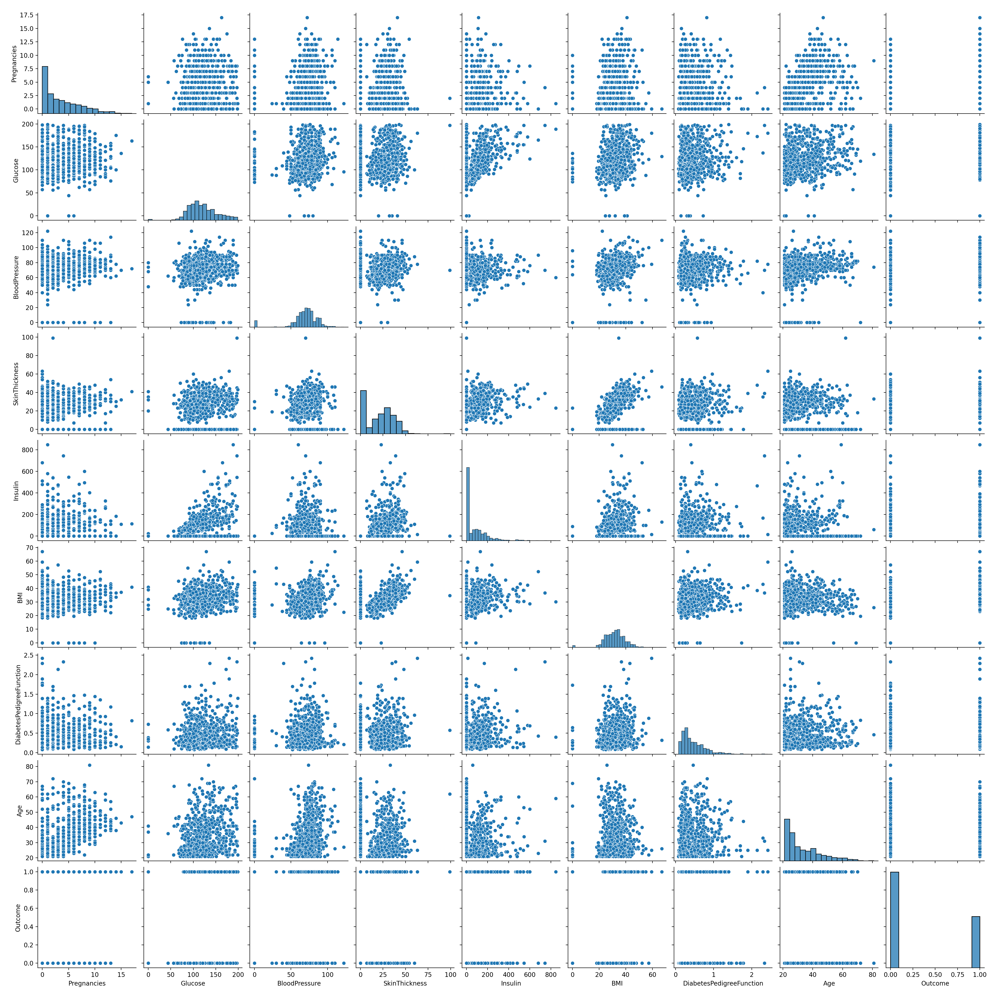

In [ ]:
sns.pairplot(df)

# Correlación entre variables

In [ ]:
df.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


<Axes: >

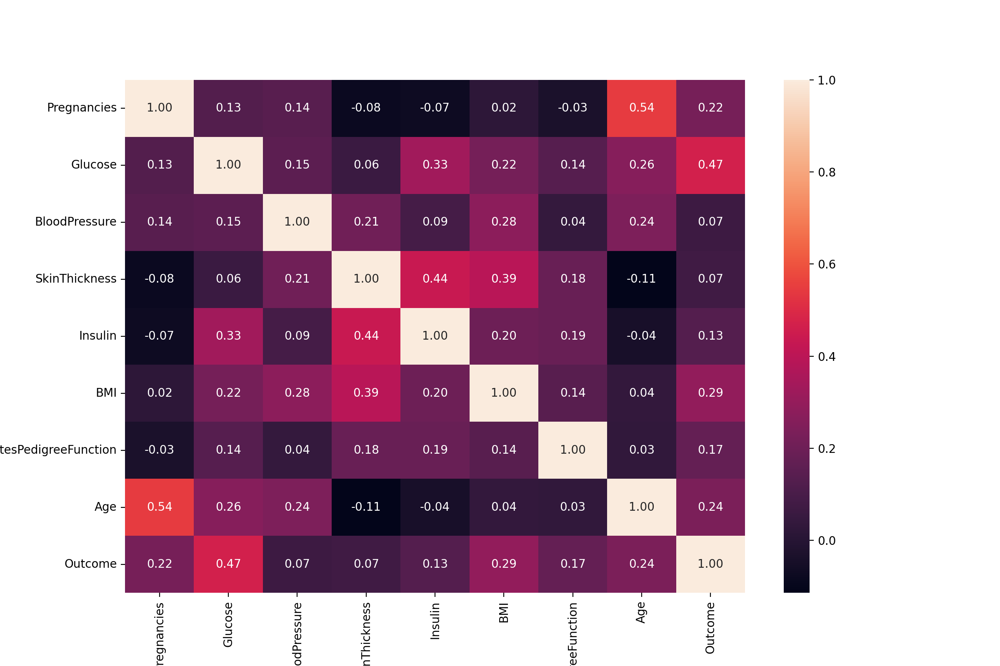

In [ ]:
fig, ax = plt.subplots(figsize = (12, 8))

sns.heatmap(df.corr(), annot=True, fmt = '.2f')

<Axes: >

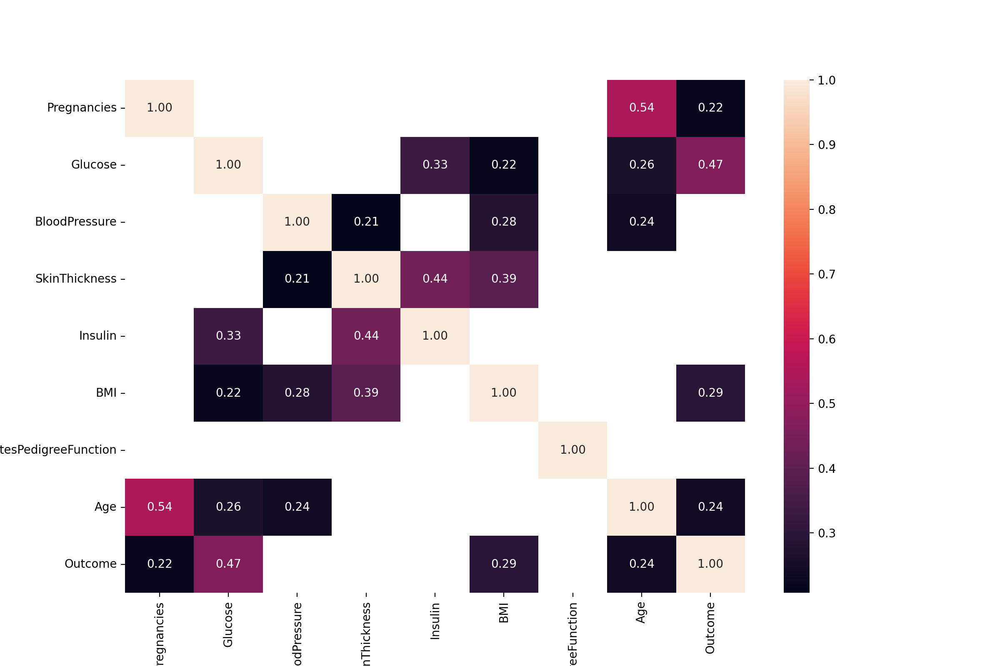

In [ ]:
fig, ax = plt.subplots(figsize = (12, 8))

sns.heatmap(df.corr()[(df.corr() > 0.2) | (df.corr() < -0.2)], annot=True, fmt = '.2f')

Tras obtener los resultados del heatmap de correlación entre las diferentes variables, encontramos que aquellas cuya correlación fuese mayor a 0.2 son aquellas más fuertes y que podrían facilitar el descarte de una u otra. Por ejemplo la **Age** con **Pregnancies** que tiene una correlación mucho mayor de 0.54.

También nos permite ver la correlación con el **Outcome** (target) entre las cuales están **BMI**, **Age** y **Glucose** que fueron previamente identificadas como importantes para el modelo.

In [ ]:
cols

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

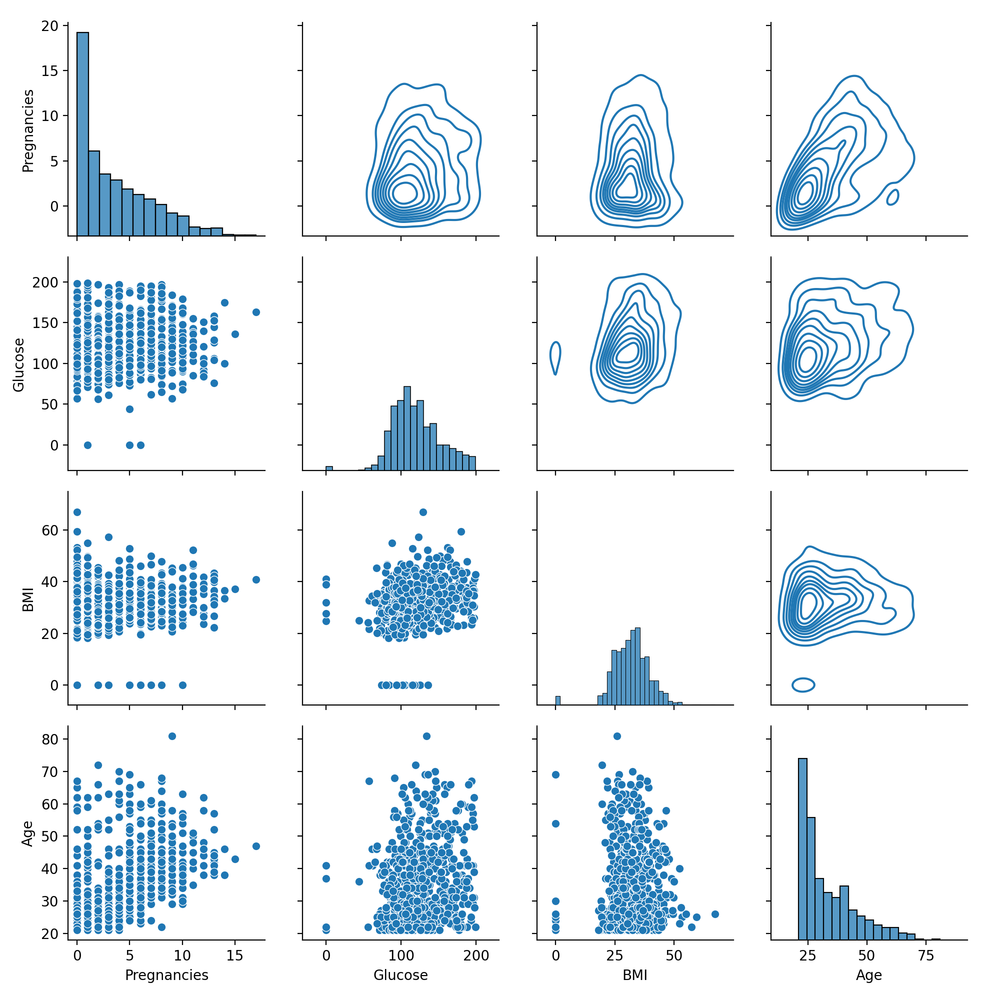

In [ ]:
g = sns.PairGrid(data = df, vars = ['Pregnancies', 'Glucose', 'BMI', 'Age'])
g.map_diag(sns.histplot)
g.map_lower(sns.scatterplot)
g.map_upper(sns.kdeplot)

En esta otra vista de la correlación entre las variables que más estuvieron correlacionadas con el Outcome: Pregnancies, Glucose, BMI y Age, se puede evidenciar que entre ellas no hay un pagtrón definido de correlación salvo levemente entre **Age** y **Pregnancies**, por lo cual una de ellas podría ser descartada. Por supuesto que con base en el digrama de cajas que vimos anteriormente, aquella que se descartaría sería **Pregnancies**, ya que **Age** tiene más distribución para determinar Diabetes.

2.

IQR (Inter Quartile Range) - https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/

In [ ]:
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(df['BMI']))
print(z)


0      0.204013
1      0.684422
2      1.103255
3      0.494043
4      1.409746
         ...   
763    0.115169
764    0.610154
765    0.735190
766    0.240205
767    0.202129
Name: BMI, Length: 768, dtype: float64


((array([-3.12069362e+00, -2.84945435e+00, -2.69768447e+00, -2.59044160e+00,
         -2.50664754e+00, -2.43745274e+00, -2.37827016e+00, -2.32640403e+00,
         -2.28013073e+00, -2.23827901e+00, -2.20001550e+00, -2.16472534e+00,
         -2.13194152e+00, -2.10130063e+00, -2.07251420e+00, -2.04534920e+00,
         -2.01961466e+00, -1.99515202e+00, -1.97182811e+00, -1.94953002e+00,
         -1.92816110e+00, -1.90763799e+00, -1.88788828e+00, -1.86884861e+00,
         -1.85046325e+00, -1.83268292e+00, -1.81546377e+00, -1.79876666e+00,
         -1.78255649e+00, -1.76680162e+00, -1.75147347e+00, -1.73654612e+00,
         -1.72199598e+00, -1.70780152e+00, -1.69394305e+00, -1.68040247e+00,
         -1.66716316e+00, -1.65420979e+00, -1.64152817e+00, -1.62910519e+00,
         -1.61692865e+00, -1.60498724e+00, -1.59327041e+00, -1.58176831e+00,
         -1.57047175e+00, -1.55937212e+00, -1.54846135e+00, -1.53773186e+00,
         -1.52717653e+00, -1.51678867e+00, -1.50656194e+00, -1.49649040e+00,

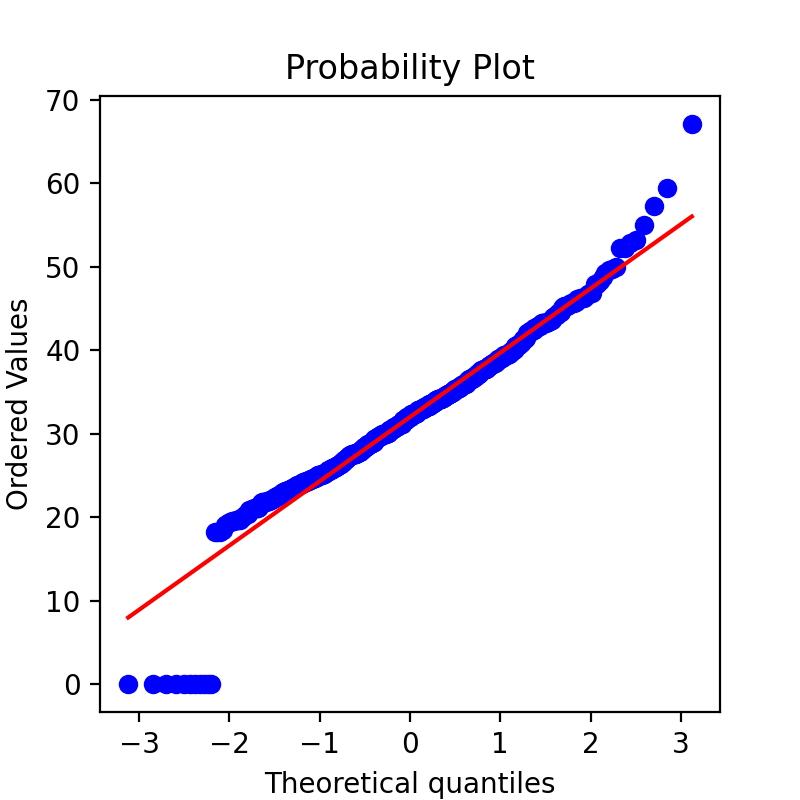

In [ ]:
# QQ - PLOT
from scipy import stats

fig, ax = plt.subplots(figsize=(4,4))
stats.probplot(df['BMI'], plot=ax)

In [ ]:
import numpy as np

threshold_z = 2

outlier_indices = np.where(z > threshold_z)[0]
no_outliers = df.drop(outlier_indices)
print("Original DataFrame Shape:", df.shape)
print("DataFrame Shape after Removing Outliers:", no_outliers.shape)


Original DataFrame Shape: (768, 9)
DataFrame Shape after Removing Outliers: (741, 9)


En este proceso podemos observar la identificación de los **outlyiers** utilizando un **QQ Plot** que se basa en el **estadístico z de la distribución normal**. Como se puede apreciar en la imagen anterior, después de la normalización, los valores que se encuentran en el intervalo inferior a -2 y superior a 2 son los outlyiers que fueron removidos del data frame original para no afectar las evaluaciones posteriores con los modelos a utilizar.

In [ ]:
df['Outcome'].value_counts()

Outcome
0    500
1    268
Name: count, dtype: int64

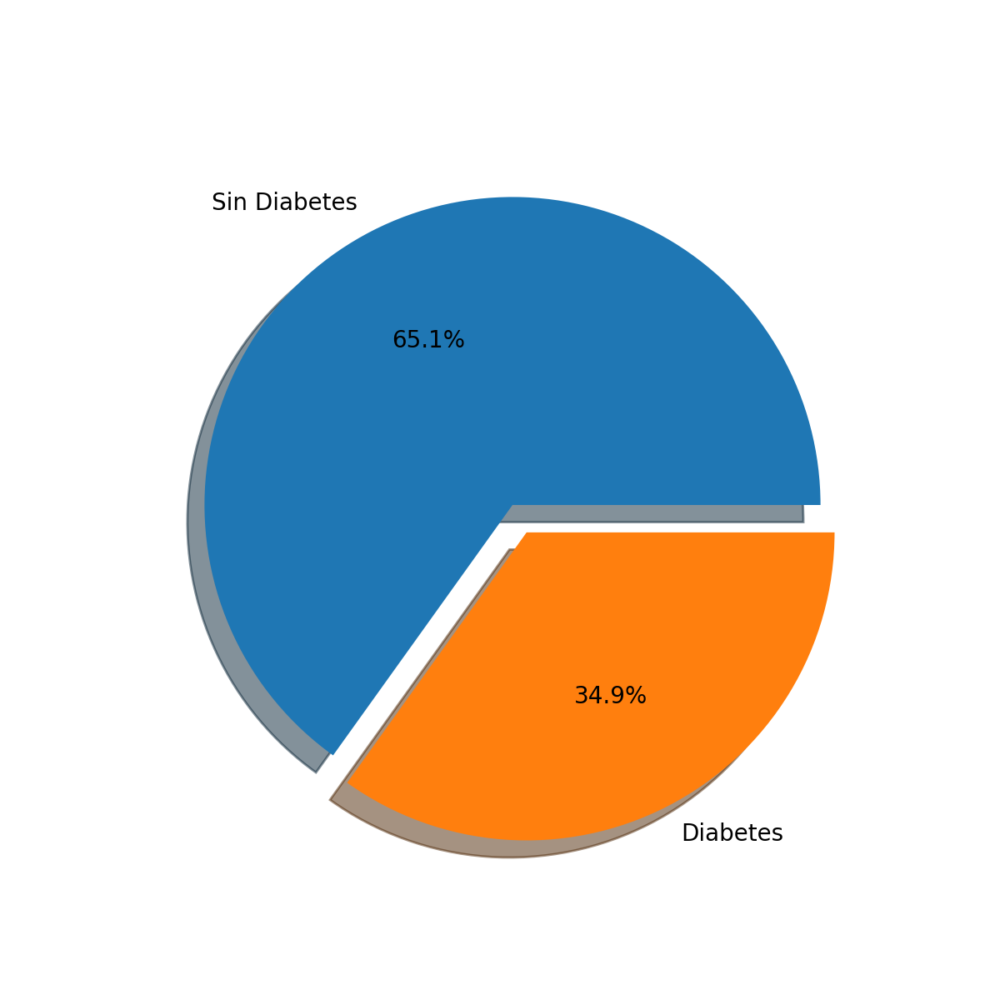

In [ ]:
porc = df['Outcome'].value_counts()

fig, ax = plt.subplots(figsize = (6,6))
ax.pie(porc, labels=['Sin Diabetes', 'Diabetes'], autopct='%1.1f%%', shadow = True, explode = [0, 0.1]);

# Split de los datos

In [ ]:
pip install scikit-learn

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
df_train, df_test = train_test_split(df, test_size=0.2, stratify=df['Outcome'])

In [ ]:
df_train.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
221,2,158,90,0,0,31.6,0.805,66,1
355,9,165,88,0,0,30.4,0.302,49,1
308,0,128,68,19,180,30.5,1.391,25,1
147,2,106,64,35,119,30.5,1.400,34,0
23,9,119,80,35,0,29.0,0.263,29,1


In [ ]:
print(df.shape)
print(type(df.shape))

(768, 9)
<class 'tuple'>


In [ ]:
df_test.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
764,2,122,70,27,0,36.8,0.340,27,0
26,7,147,76,0,0,39.4,0.257,43,1
81,2,74,0,0,0,0.0,0.102,22,0
451,2,134,70,0,0,28.9,0.542,23,1
484,0,145,0,0,0,44.2,0.630,31,1


In [ ]:
print(df.shape)
print(type(df.shape))

(768, 9)
<class 'tuple'>


# Importancia de variables

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier

In [ ]:
X_train = df_train.drop('Outcome', axis = 1)
y_train = df_train['Outcome']

X_test = df_test.drop('Outcome', axis = 1)
y_test = df_test['Outcome']

In [ ]:
y_train.value_counts(normalize = True)

Outcome
0    0.651466
1    0.348534
Name: proportion, dtype: float64

In [ ]:
y_test.value_counts(normalize = True)

Outcome
0    0.649351
1    0.350649
Name: proportion, dtype: float64

In [ ]:
dtc = DecisionTreeClassifier(criterion='gini', max_depth=3, random_state=1234)

dtc.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=1234)

In [ ]:
dtc.feature_importances_

array([0.        , 0.56454687, 0.        , 0.        , 0.        ,
       0.25442509, 0.05499496, 0.12603307])

In [ ]:
feature_importance = pd.Series(dtc.feature_importances_, index = X_train.columns)
imp = feature_importance[feature_importance > 0]
imp

Glucose                     0.564547
BMI                         0.254425
DiabetesPedigreeFunction    0.054995
Age                         0.126033
dtype: float64

Text(0.5, 1.0, 'Importancia de variables')

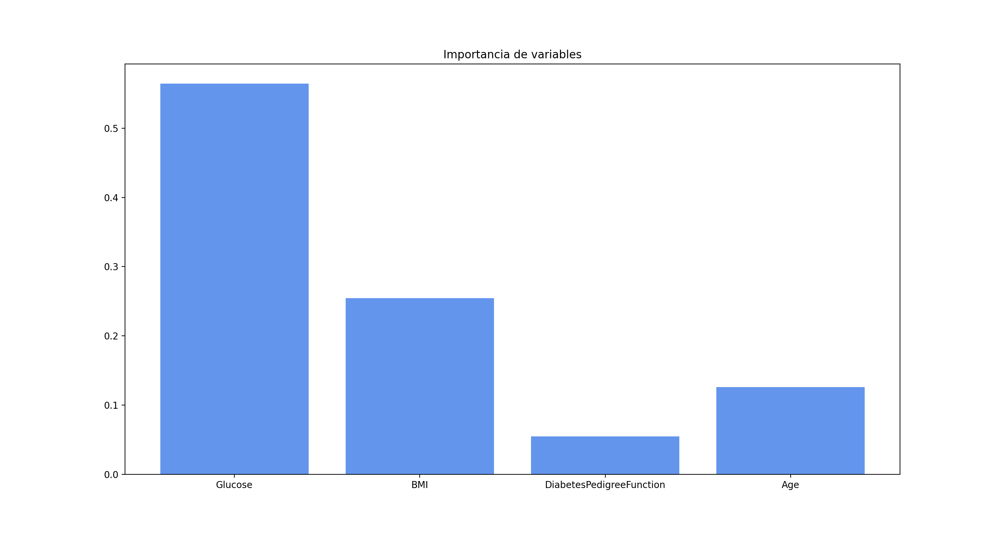

In [ ]:
fig, ax = plt.subplots(figsize = (15, 8))

ax.bar(x = imp.index, height = imp.values, color = 'cornflowerblue')

ax.set_title('Importancia de variables')

Como se puede observar en la gráfica anterior, tras evaluar los feature_importances de un modelo basado en **DecisionTree**, la **Glucose**, BMI, **DiabetesPedigreeFuncton** y **Age** fueron evaluados como las variables más importantes, siendo **Glucose** la más importante. Por ende, serán las que se utilizarán en los modelos posteriores.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel

In [ ]:
lr = LogisticRegression()
sfm = SelectFromModel(estimator=lr)
sfm.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


SelectFromModel(estimator=LogisticRegression())

In [ ]:
sfm.estimator_.coef_

array([[ 1.42942947e-01,  2.91364272e-02, -2.45625067e-02,
         8.15302803e-03, -1.22193974e-03,  6.84362981e-02,
         2.16656803e+00,  1.36097500e-02]])

In [ ]:
sfm.get_support()

array([False, False, False, False, False, False,  True, False])

In [ ]:
fi = pd.Series(sfm.estimator_.coef_[0], index = X_train.columns)
fi

Pregnancies                 0.142943
Glucose                     0.029136
BloodPressure              -0.024563
SkinThickness               0.008153
Insulin                    -0.001222
BMI                         0.068436
DiabetesPedigreeFunction    2.166568
Age                         0.013610
dtype: float64

De acuerdo con el fi de la Regresión Logística se puede evidenciar que los valores que se encuentran por encima de 0.01 son aquellas variables que más ingerencia e importancia tendrán al momento de clasificar la variable objetivo Outcome: **Pregnancies**, **Glucose**, **BMI**, **DiabetesPedigreeFunction** y **Age**.

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

3.

# Modelo 1: Regresión Logística

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()

# Entrenamos el modelo

In [ ]:
result = model.fit(X_train, y_train)

Validamos el resultado del entrenamiento

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

In [ ]:
prediction_test = model.predict(X_test)
acurrancy = accuracy_score(y_test, prediction_test)

print(f'Accuracy: {acurrancy * 100}%')
print("prediction",prediction_test)

Accuracy: 79.87012987012987%
prediction [0 1 0 0 1 0 1 1 0 0 0 0 1 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 1 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 1 0 1 0 0 1 0
 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 0 0 0 1 1 0
 1 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 1 1 0 1 1 1 1
 0 0 0 1 0 0]


# Matriz de confusión

In [ ]:
from sklearn.metrics import confusion_matrix
from seaborn import heatmap

[[87 13]
 [18 36]]


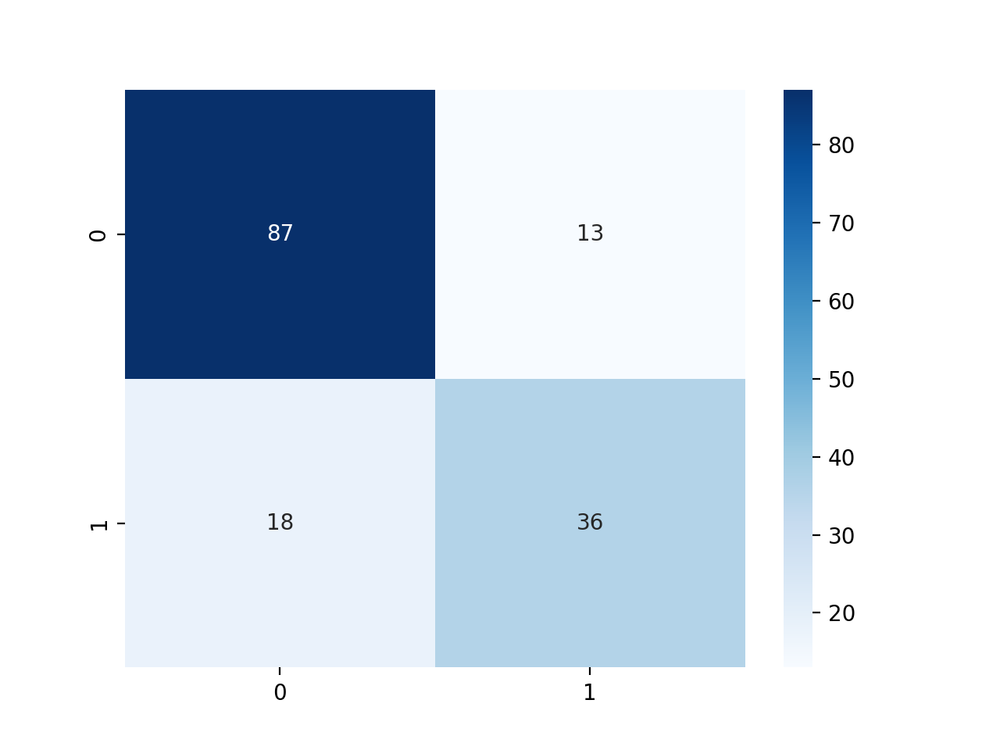

In [ ]:
conf_matrix = confusion_matrix(y_test, prediction_test)
heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
print(conf_matrix)

De acuerdo con la **matriz de confusión** presentada en el modelo de Regresión Logística anterior, se puede evidenciar que el modelo es fuertemente sensible a detectar Verdaderos Positivos y tiene una aceptable capacidad de identificar también Verdaderos Negativos.

# Modelo 2: DecisionTree


In [ ]:
import sklearn
import sklearn.tree
import sklearn.pipeline
import sklearn.compose
import sklearn.ensemble

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dtc = sklearn.tree.DecisionTreeClassifier(random_state=0)

X_variables = ["Glucose","BMI","Age"]
target = "Outcome"
model_no = 1
pred_col = f'predictions_{model_no}'

dtc.fit(df_train[X_variables], df_train[target])
df_train[pred_col] = dtc.predict_proba(df_train[X_variables])[:,1]
df_test[pred_col] = dtc.predict_proba(df_test[X_variables])[:,1]

In [ ]:
pd.concat([
    df_train[target], df_train[f'predictions_{model_no}'], df_train[f'predictions_{model_no}'].round().astype(bool)
], axis=1)

,Outcome,predictions_1,predictions_1
221,1,1.0,True
355,1,1.0,True
308,1,1.0,True
147,0,0.0,False
23,1,1.0,True
...,...,...,...
637,0,0.0,False
417,1,1.0,True
623,0,0.0,False
80,0,0.0,False


In [ ]:
auc_train = sklearn.metrics.roc_auc_score(df_train[target], df_train[pred_col])
auc_test = sklearn.metrics.roc_auc_score(df_test[target], df_test[pred_col])

acc_train = sklearn.metrics.accuracy_score(df_train[target], df_train[pred_col].round())
acc_test = sklearn.metrics.accuracy_score(df_test[target], df_test[pred_col].round())

print(f'The auc in train is {auc_train:.3} and in test it is {auc_test:.3}, the accuracies are {acc_train:.1%} and {acc_test:.1%}')

The auc in train is 1.0 and in test it is 0.721, the accuracies are 100.0% and 75.3%


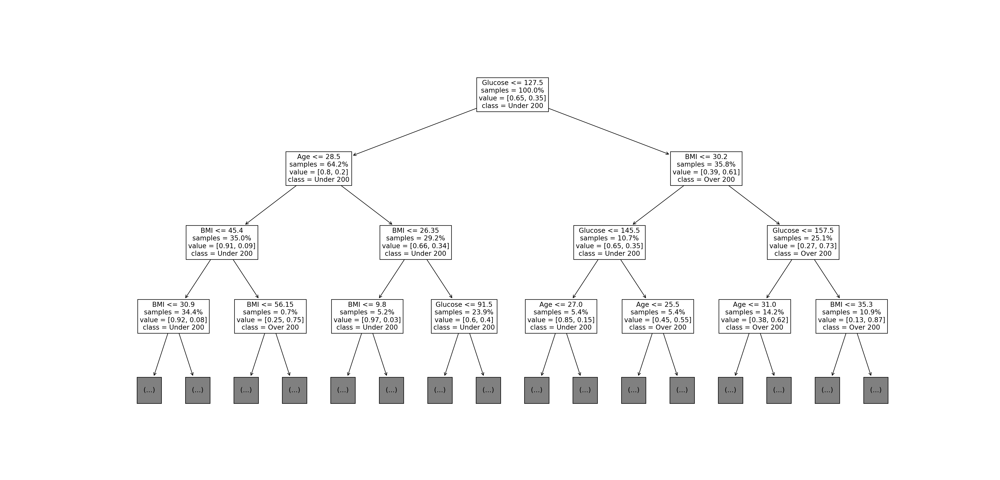

In [ ]:
cutoff=200
plt.figure(figsize=(25, 12))
sklearn.tree.plot_tree(
    dtc, fontsize=12, feature_names=X_variables, class_names=[f'Under {cutoff}', f'Over {cutoff}'], max_depth=3,
    impurity=False, proportion=True, precision=2
)
plt.show()

# Modelo 3: RandomForest


In [ ]:
import sklearn
import sklearn.tree
import sklearn.pipeline
import sklearn.compose
import sklearn.ensemble

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dtc = sklearn.ensemble.RandomForestClassifier(random_state=0)

X_variables = ["Glucose","BMI","Age"]
target = "Outcome"
model_no = 2
pred_col = f'predictions_{model_no}'

dtc.fit(df_train[X_variables], df_train[target])
df_train[pred_col] = dtc.predict_proba(df_train[X_variables])[:,1]
df_test[pred_col] = dtc.predict_proba(df_test[X_variables])[:,1]

In [ ]:
pd.concat([
    df_train[target], df_train[f'predictions_{model_no}'], df_train[f'predictions_{model_no}'].round().astype(bool)
], axis=1)

,Outcome,predictions_2,predictions_2
221,1,0.79,True
355,1,0.81,True
308,1,0.72,True
147,0,0.20,False
23,1,0.74,True
...,...,...,...
637,0,0.00,False
417,1,0.84,True
623,0,0.10,False
80,0,0.02,False


In [ ]:
auc_train = sklearn.metrics.roc_auc_score(df_train[target], df_train[pred_col])
auc_test = sklearn.metrics.roc_auc_score(df_test[target], df_test[pred_col])

acc_train = sklearn.metrics.accuracy_score(df_train[target], df_train[pred_col].round())
acc_test = sklearn.metrics.accuracy_score(df_test[target], df_test[pred_col].round())

print(f'The auc in train is {auc_train:.3} and in test it is {auc_test:.3}, the accuracies are {acc_train:.1%} and {acc_test:.1%}')

The auc in train is 1.0 and in test it is 0.855, the accuracies are 100.0% and 78.6%


Tras utilizar el modelo de RandomForestClassifier sin realizar optimización estructurada por hiperparámetros, pudimos evaluar con el auc y el accuracy que el modelo clasifica perfectamente en entrenamiento aunque en test disminuye su capacidad con un accuracy del 78%.

Para equilibrar ambos porcentajes del auc y del acurracy, se realizará una especificación de los hiperparámetros max_depth (máxima profundidad del árbol) y min_samples_leaf (cantidad de nodos finales mínimo aceptables tras entrenar el modelo).



# Modelo 4 - Random Forest con especificación de profundidad y hojas



In [ ]:
from sklearn.tree import DecisionTreeClassifier

dtc = sklearn.ensemble.RandomForestClassifier(random_state=0, max_depth=7, min_samples_leaf=5)

X_variables = ["Glucose","BMI","Age"]
target = "Outcome"
model_no = 3
pred_col = f'predictions_{model_no}'

dtc.fit(df_train[X_variables], df_train[target])
df_train[pred_col] = dtc.predict_proba(df_train[X_variables])[:,1]
df_test[pred_col] = dtc.predict_proba(df_test[X_variables])[:,1]

In [ ]:
pd.concat([
    df_train[target], df_train[f'predictions_{model_no}'], df_train[f'predictions_{model_no}'].round().astype(bool)
], axis=1)

,Outcome,predictions_3,predictions_3
221,1,0.685815,True
355,1,0.778033,True
308,1,0.477873,False
147,0,0.360479,False
23,1,0.401089,False
...,...,...,...
637,0,0.073680,False
417,1,0.629287,True
623,0,0.206361,False
80,0,0.055366,False


In [ ]:
auc_train = sklearn.metrics.roc_auc_score(df_train[target], df_train[pred_col])
auc_test = sklearn.metrics.roc_auc_score(df_test[target], df_test[pred_col])

acc_train = sklearn.metrics.accuracy_score(df_train[target], df_train[pred_col].round())
acc_test = sklearn.metrics.accuracy_score(df_test[target], df_test[pred_col].round())

print(f'The auc in train is {auc_train:.3} and in test it is {auc_test:.3}, the accuracies are {acc_train:.1%} and {acc_test:.1%}')

The auc in train is 0.916 and in test it is 0.867, the accuracies are 83.9% and 79.2%


En este caso se puede evidenciar que a pesar de que el auc disminuyó en train, aumentó en test y la accuracy también aumentó a 79,2%, lo cual compensa bastante bien entre las dos métricas, evidenciando un modelo más equilibrado en auc y accuracy.

In [ ]:
from sklearn.tree import export_graphviz
estimator = dtc.estimators_[5]
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                feature_names = X_variables,
                class_names = target,
                rounded = True, proportion = False,
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

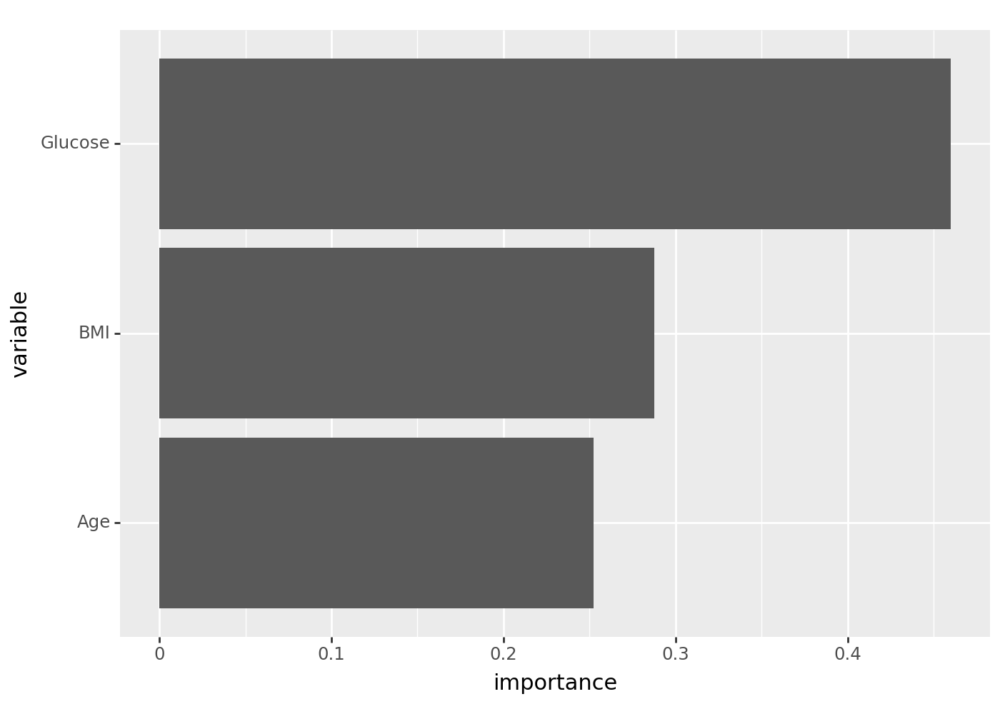

In [ ]:
graph_data = pd.DataFrame(
    [(imp, variable) for imp, variable in zip(dtc.feature_importances_, X_variables)],
    columns=['importance', 'variable']
).sort_values('importance', ascending=False)

limit = 15
graph = (
    pn.ggplot(graph_data.head(limit), pn.aes(x='variable', y='importance'))
    + pn.geom_col()
    + pn.coord_flip()
    + pn.theme(figure_size=(7, 5))
    + pn.scale_x_discrete(limits=graph_data.head(limit).variable.unique()[::-1])
)

graph.draw()

En este caso el modelo también fue capaz de identificar que la variable más importante entre las tres prefiltradas sigue siendo la **Glucose**.

In [ ]:
import plotnine as pn

# Modelo 5 - Random Forest Optimizado

In [ ]:
from sklearn.metrics import roc_auc_score, accuracy_score
grid = {
    'n_estimators': [100, 500],
    'max_depth': [None, 5, 10],
    'min_samples_leaf': [1, 5, 10],
    'min_samples_split': [2, 5, 10]
}

optimized_pipeline = sklearn.model_selection.GridSearchCV(dtc, grid, cv=5, scoring='roc_auc')

#####
model_no = 4
pred_col = f'predictions_{model_no}'

optimized_pipeline.fit(df_train[X_variables], df_train[target])
df_train[pred_col] = optimized_pipeline.predict_proba(df_train[X_variables])[:,1]
df_test[pred_col] = optimized_pipeline.predict_proba(df_test[X_variables])[:,1]

auc_train = sklearn.metrics.roc_auc_score(df_train[target], df_train[pred_col])
auc_test = sklearn.metrics.roc_auc_score(df_test[target], df_test[pred_col])

acc_train = sklearn.metrics.accuracy_score(df_train[target], df_train[pred_col].round())
acc_test = sklearn.metrics.accuracy_score(df_test[target], df_test[pred_col].round())

print(f'The auc in train is {auc_train:.3} and in test it is {auc_test:.3}, the accuracies are {acc_train:.1%} and {acc_test:.1%}')

The auc in train is 0.901 and in test it is 0.866, the accuracies are 82.4% and 79.2%


Al realizar un cuarto modelo de RandomForest con validación cruzada en malla con GridSearchCV y un scoring roc_auc de área bajo la curva, se puede identificar que el modelo sigue siendo más equilibrado ajustado a un auc del 0.866 para test y un acurracy del 79.2%

In [ ]:
optimized_pipeline.best_params_

{'max_depth': 5,
 'min_samples_leaf': 1,
 'min_samples_split': 10,
 'n_estimators': 500}

Comparando la utilidad real

In [ ]:
results = []
renames = {0 : 'recall', 1 : 'precision', 2 : 'threshold'}
for i in range(1, 5):
    sklearn.metrics.precision_recall_curve(df_test[target], df_test[f'predictions_{i}'])
    result = pd.DataFrame(sklearn.metrics.precision_recall_curve(df_test[target], df_test[f'predictions_{i}'])).transpose().rename(columns=renames)
    result['prediction_number'] = str(i)
    results.append(result)

results = pd.concat(results)
print(results)

       recall  precision  threshold prediction_number
0    0.350649   1.000000   0.000000                 1
1    0.660000   0.611111   1.000000                 1
2    1.000000   0.000000        NaN                 1
0    0.350649   1.000000   0.000000                 2
1    0.385714   1.000000   0.010000                 2
..        ...        ...        ...               ...
150  0.750000   0.055556   0.825815                 4
151  0.666667   0.037037   0.831573                 4
152  0.500000   0.018519   0.845373                 4
153  1.000000   0.018519   0.846196                 4
154  1.000000   0.000000        NaN                 4

[382 rows x 4 columns]


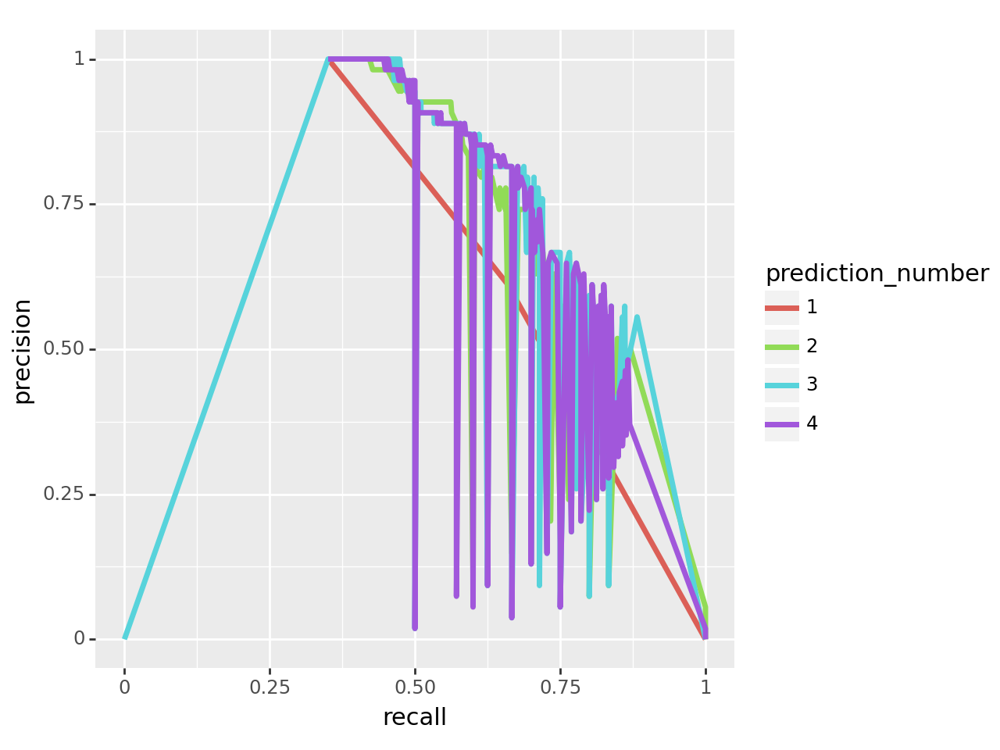

In [ ]:
graph = (
    pn.ggplot(results, pn.aes(x='recall', y='precision', color='prediction_number'))
    + pn.geom_line(size=1.4)
)

graph.draw()

Finalmente los siguientes modelos fueron comparados utilizando las métricas de **precision** y **recall**:



1.   Decision Tree
2.   Random Forest
3.   Random Forest con hiperparámetros optimizados
4.   Random Forest con validación cruzada

**Conclusión**: el modelo que más nos pareció estable en cuanto a ambas métricas fue el de **RandomForest** **sin optimización** ya que con un **0.5 de recall **alcanza casi un **95% de precisión**, lo cual es el mejor balance para determinar la clasificación de **Diabetes**.

